# Calling various functions (some do, some are just coded into here) in the pre_training_analysis_tools file to display the results here

# Does the following:
## removes metrics with a low variance level (set to 0) -i.e. single value
## finds all highly correlated values, and removes the metric less correlated with maven reuse 
## started to write down some hyper-parameters to test for (when have different reuse rate classes)
## using shap, to explain the importance of each metric (maybe leave if cant explain what happening)
## recursive feature elimination with cross validation - scikit learn
## also selecting metrics in accordance stats - like anova, f-regression (not really sure what to do with this)
## pandas profiling - short report at the bottom


### References:
References about feature selection, used some, some haven't - dont understand when to use etc, and also jsut dumping some of the tabs i have opened here
https://towardsdatascience.com/feature-selection-techniques-for-classification-and-python-tips-for-their-application-10c0ddd7918b
https://towardsdatascience.com/overview-of-feature-selection-methods-a2d115c7a8f7
https://github.com/jundongl/scikit-feature/blob/master/skfeature/function/similarity_based/lap_score.py

other:
http://rasbt.github.io/mlxtend/


### run the code in sequential order, until the next comment which says to not

In [26]:
# import external modules
import pandas as pd
import numpy as np

from sklearn.feature_selection import SelectKBest
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm

# import local modules.e
from utils import data_loader, pre_training_analysis_tools
from model.base_model import BaseModel



In [27]:
# data - both x and y 
data = data_loader.load_real_dataset()



# getting the x or y component of the data
data_x = data['train_x']
data_y = data['train_y']
#test_x = data['test_x']
#test_y = data['test_y']

# normalising the data
# code sourced from here: https://stackoverflow.com/questions/26414913/normalize-columns-of-pandas-data-frame
from sklearn import preprocessing

#x = data_x.values #returns a numpy array
#min_max_scaler = preprocessing.MinMaxScaler()
#x_scaled = min_max_scaler.fit_transform(x)
#data_x = pd.DataFrame(x_scaled, columns=data_x.columns)

#x = test_x.values #returns a numpy array
#min_max_scaler = preprocessing.MinMaxScaler()
#x_scaled = min_max_scaler.fit_transform(x)
#test_x = pd.DataFrame(x_scaled, columns=test_x.columns)

# since the function below requires both the x and y in a dataframe, this goes through some code to achieve that 
x = data_x
y = data_y
#concat two dataframes for better visualization 
pd.set_option('display.max_rows', None)
matrix = pd.concat([x,y],axis=1)


matrix.dropna(how='any', inplace=True)
display(matrix.describe())

#matrix['maven_reuse'] = np.where(matrix['maven_reuse'].between(0,34), 1, matrix['maven_reuse'])
#matrix['maven_reuse'] = np.where(matrix['maven_reuse'].between(35,229), 2, matrix['maven_reuse'])
#matrix['maven_reuse'] = np.where(matrix['maven_reuse'].between(230,100000), 3, matrix['maven_reuse'])

display(matrix)


#breaking it up into a and y again
# storing the output data into a var
data_x = matrix
data_y = matrix.pop('maven_reuse')



,synchronizedMethodsQty_sum,synchronizedMethodsQty_average,synchronizedMethodsQty_stdev,synchronizedMethodsQty_median,synchronizedMethodsQty_min,synchronizedMethodsQty_max,parenthesizedExpsQty_sum,parenthesizedExpsQty_average,parenthesizedExpsQty_stdev,parenthesizedExpsQty_median,...,innerClassesQty_min,innerClassesQty_max,comparisonsQty_sum,comparisonsQty_average,comparisonsQty_stdev,comparisonsQty_median,comparisonsQty_min,comparisonsQty_max,constant,maven_reuse
count,173.000000,173.000000,173.000000,173.0,173.0,173.000000,173.000000,173.000000,173.000000,173.000000,...,173.0,173.000000,173.000000,173.000000,173.000000,173.000000,173.0,173.000000,173.0,173.000000
mean,0.085922,0.038660,0.065700,0.0,0.0,0.113224,0.037875,0.078233,0.126569,0.015896,...,0.0,0.062098,0.019016,0.058002,0.113700,0.020401,0.0,0.151032,0.0,1.791908
std,0.187162,0.089894,0.106665,0.0,0.0,0.171326,0.081849,0.132774,0.181103,0.101408,...,0.0,0.116285,0.039637,0.092140,0.131836,0.094849,0.0,0.172901,0.0,0.709195
min,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.000000,0.000023,0.001507,0.000000,0.000000,0.0,0.001669,0.0,1.000000
25%,0.000801,0.001438,0.006549,0.0,0.0,0.008772,0.001974,0.014706,0.027840,0.000000,...,0.0,0.008380,0.001087,0.020293,0.040727,0.000000,0.0,0.033389,0.0,1.000000
50%,0.012019,0.013365,0.034174,0.0,0.0,0.043860,0.007501,0.033409,0.058057,0.000000,...,0.0,0.019553,0.004437,0.032653,0.074812,0.000000,0.0,0.071786,0.0,2.000000
75%,0.064904,0.041632,0.079340,0.0,0.0,0.140351,0.034595,0.080866,0.125344,0.000000,...,0.0,0.053073,0.015984,0.067637,0.143312,0.000000,0.0,0.212020,0.0,2.000000
max,1.000000,1.000000,1.000000,0.0,0.0,1.000000,0.431970,1.000000,1.000000,1.000000,...,0.0,1.000000,0.180475,1.000000,1.000000,1.000000,0.0,1.000000,0.0,3.000000


,synchronizedMethodsQty_sum,synchronizedMethodsQty_average,synchronizedMethodsQty_stdev,synchronizedMethodsQty_median,synchronizedMethodsQty_min,synchronizedMethodsQty_max,parenthesizedExpsQty_sum,parenthesizedExpsQty_average,parenthesizedExpsQty_stdev,parenthesizedExpsQty_median,...,innerClassesQty_min,innerClassesQty_max,comparisonsQty_sum,comparisonsQty_average,comparisonsQty_stdev,comparisonsQty_median,comparisonsQty_min,comparisonsQty_max,constant,maven_reuse
0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000099,0.073529,0.041181,0.50,...,0.0,0.000000,0.000045,0.055446,0.000000,0.235294,0.0,0.003339,0.0,1.0
1,0.098558,0.050956,0.283577,0.0,0.0,0.763158,0.042442,0.085223,0.152778,0.00,...,0.0,0.033520,0.021395,0.070615,0.244849,0.000000,0.0,0.539232,0.0,2.0
2,0.017628,0.054101,0.091959,0.0,0.0,0.087719,0.009574,0.114118,0.242659,0.00,...,0.0,0.011173,0.003951,0.077402,0.182501,0.000000,0.0,0.178631,0.0,2.0
3,0.108974,0.099065,0.156196,0.0,0.0,0.184211,0.045995,0.162392,0.640273,0.00,...,0.0,0.019553,0.009588,0.055643,0.219961,0.000000,0.0,0.373957,0.0,1.0
4,0.058494,0.037029,0.230749,0.0,0.0,0.578947,0.020382,0.050112,0.078668,0.00,...,0.0,0.005587,0.013448,0.054348,0.115345,0.000000,0.0,0.180301,0.0,2.0
5,0.000801,0.000159,0.001956,0.0,0.0,0.008772,0.034595,0.026721,0.035554,0.00,...,0.0,0.039106,0.015984,0.020293,0.039790,0.000000,0.0,0.056761,0.0,2.0
6,0.007212,0.005372,0.017297,0.0,0.0,0.026316,0.063860,0.184752,0.302871,0.00,...,0.0,0.044693,0.024474,0.116382,0.350526,0.000000,0.0,0.429048,0.0,2.0
7,0.007212,0.003221,0.015766,0.0,0.0,0.035088,0.004984,0.008645,0.033078,0.00,...,0.0,0.427374,0.003475,0.009908,0.035176,0.000000,0.0,0.056761,0.0,1.0
8,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000543,0.028887,0.027840,0.00,...,0.0,0.013966,0.000170,0.014851,0.020439,0.000000,0.0,0.008347,0.0,1.0
9,0.491987,0.062188,0.192507,0.0,0.0,0.719298,0.038395,0.018849,0.041963,0.00,...,0.0,0.044693,0.041828,0.033751,0.067183,0.000000,0.0,0.138564,0.0,1.0


In [28]:
# This gets the list of features (not well formatted) after removing the ones that have a 
# variance below the min threshold (by default threshold is 0, can cahnge in the variancethreshold)

from sklearn.feature_selection import VarianceThreshold
selector = VarianceThreshold(threshold=0.0)
print("Original feature shape:", data_x.shape)
new_X = selector.fit_transform(data_x)
print("Transformed feature shape:", new_X.shape)
data_x = data_x.loc[:, selector.get_support()]

print(data_x.columns)



Original feature shape: (173, 265)
Transformed feature shape: (173, 207)
Index(['synchronizedMethodsQty_sum', 'synchronizedMethodsQty_average',
       'synchronizedMethodsQty_stdev', 'synchronizedMethodsQty_max',
       'parenthesizedExpsQty_sum', 'parenthesizedExpsQty_average',
       'parenthesizedExpsQty_stdev', 'parenthesizedExpsQty_median',
       'parenthesizedExpsQty_max', 'lcom_sum',
       ...
       'finalMethodsQty_max', 'innerClassesQty_sum', 'innerClassesQty_average',
       'innerClassesQty_stdev', 'innerClassesQty_max', 'comparisonsQty_sum',
       'comparisonsQty_average', 'comparisonsQty_stdev',
       'comparisonsQty_median', 'comparisonsQty_max'],
      dtype='object', length=207)


In [29]:
# since the function below requires both the x and y in a dataframe, this goes through some code to achieve that 
x = data_x
y = data_y
#concat two dataframes for better visualization 
pd.set_option('display.max_rows', None)
matrix = pd.concat([x,y],axis=1)

In [ ]:
# remove due to excess of 40% of zero's

matrix = matrix.drop(['stringLiteralsQty_median', 'totalFieldsQty_sum', 'totalFieldsQty_average', 'totalFieldsQty_stdev',
 'totalFieldsQty_max', 'staticFieldsQty_median', 'numbersQty_median', 'nosi_median',
 'maxNestedBlocksQty_median', 'lambdasQty_sum', 'lambdasQty_average', 'lambdasQty_stdev', 
 'protectedFieldsQty_median', 'comparisonsQty_median','loopQty_median','tcc_median', 'tcc_min', 'privateMethodsQty_median', 'publicFieldsQty_median', 'parenthesizedExpsQty_median',
'stringLiteralsQty_median', 'defaultMethodsQty_median', 'dit_median',
'lcc_median', 'lcc_min', 'mathOperationsQty_median', 'staticMethodsQty_median', 'tryCatchQty_median',
'modifiers_min', 'finalFieldsQty_median'],axis=1)



display(matrix)


In [7]:


#pre_training_analysis_tools.display_correlation_heatmap(matrix)

# calling function to remove highly correlated features - by removing the one that is less
# highly correlated with the target/dependent variable
output_data = pre_training_analysis_tools.remove_collinear_features(matrix, 'maven_reuse', 0.80, 'False')

#output_data = pre_training_analysis_tools.correlation(matrix, 0.90)

synchronizedMethodsQty_stdev | synchronizedMethodsQty_average | 0.92
synchronizedMethodsQty_stdev: -0.076
synchronizedMethodsQty_average: -0.007
dropped: synchronizedMethodsQty_average
-----------------------------------------------------------------------------
synchronizedMethodsQty_max | synchronizedMethodsQty_stdev | 0.81
synchronizedMethodsQty_max: -0.065
synchronizedMethodsQty_stdev: -0.076
dropped: synchronizedMethodsQty_max
-----------------------------------------------------------------------------
parenthesizedExpsQty_sum | synchronizedMethodsQty_sum | 0.96
parenthesizedExpsQty_sum: 0.149
synchronizedMethodsQty_sum: 0.117
dropped: synchronizedMethodsQty_sum
-----------------------------------------------------------------------------
parenthesizedExpsQty_stdev | parenthesizedExpsQty_average | 0.87
parenthesizedExpsQty_stdev: -0.026
parenthesizedExpsQty_average: 0.093
dropped: parenthesizedExpsQty_stdev
-------------------------------------------------------------------------

mathOperationsQty_stdev | parenthesizedExpsQty_average | 0.8
mathOperationsQty_stdev: 0.007
parenthesizedExpsQty_average: 0.093
dropped: mathOperationsQty_stdev
-----------------------------------------------------------------------------
returnQty_sum | privateMethodsQty_sum | 0.93
returnQty_sum: 0.196
privateMethodsQty_sum: 0.227
dropped: returnQty_sum
-----------------------------------------------------------------------------
returnQty_average | rfc_average | 0.82
returnQty_average: 0.14
rfc_average: 0.137
dropped: rfc_average
-----------------------------------------------------------------------------
returnQty_stdev | returnQty_average | 0.86
returnQty_stdev: 0.048
returnQty_average: 0.14
dropped: returnQty_stdev
-----------------------------------------------------------------------------
modifiers_sum | privateMethodsQty_sum | 0.87
modifiers_sum: 0.104
privateMethodsQty_sum: 0.227
dropped: modifiers_sum
-------------------------------------------------------------------------

loc_median | loc_average | 0.85
loc_median: 0.164
loc_average: 0.155
dropped: loc_average
-----------------------------------------------------------------------------
cbo_sum | privateMethodsQty_sum | 0.97
cbo_sum: 0.189
privateMethodsQty_sum: 0.227
dropped: cbo_sum
-----------------------------------------------------------------------------
variablesQty_sum | privateMethodsQty_sum | 0.92
variablesQty_sum: 0.157
privateMethodsQty_sum: 0.227
dropped: variablesQty_sum
-----------------------------------------------------------------------------
variablesQty_average | loc_median | 0.84
variablesQty_average: 0.121
loc_median: 0.164
dropped: variablesQty_average
-----------------------------------------------------------------------------
variablesQty_median | loc_median | 0.96
variablesQty_median: 0.151
loc_median: 0.164
dropped: variablesQty_median
-----------------------------------------------------------------------------
variablesQty_max | uniqueWordsQty_max | 0.93
variablesQty_max:

In [30]:
# storing the output data into a var
#data_x_y = output_data
data_x_y = matrix
whole_data = data_x_y

# Displays the all the current data left after above steps have been done


#data_x_y = pd.concat([data_x_y.pop(x) for x in ['cbo_stdev', 'maven_reuse']], axis=1)

#pd.set_option('display.max_rows', None)
#pd.set_option('display.max_columns', None)
#pd.set_option('display.width', None)
#pd.set_option('display.max_colwidth', -1)

display(data_x_y)
display(len(data_x_y.columns))




,synchronizedMethodsQty_sum,synchronizedMethodsQty_average,synchronizedMethodsQty_stdev,synchronizedMethodsQty_max,parenthesizedExpsQty_sum,parenthesizedExpsQty_average,parenthesizedExpsQty_stdev,parenthesizedExpsQty_median,parenthesizedExpsQty_max,lcom_sum,...,innerClassesQty_sum,innerClassesQty_average,innerClassesQty_stdev,innerClassesQty_max,comparisonsQty_sum,comparisonsQty_average,comparisonsQty_stdev,comparisonsQty_median,comparisonsQty_max,maven_reuse
0,0.000000,0.000000,0.000000,0.000000,0.000099,0.073529,0.041181,0.50,0.004673,0.000002,...,0.000000,0.000000,0.000000,0.000000,0.000045,0.055446,0.000000,0.235294,0.003339,1.0
1,0.098558,0.050956,0.283577,0.763158,0.042442,0.085223,0.152778,0.00,0.207944,0.137882,...,0.030488,0.315819,0.074528,0.033520,0.021395,0.070615,0.244849,0.000000,0.539232,2.0
2,0.017628,0.054101,0.091959,0.087719,0.009574,0.114118,0.242659,0.00,0.200935,0.005994,...,0.002879,0.177055,0.038357,0.011173,0.003951,0.077402,0.182501,0.000000,0.178631,2.0
3,0.108974,0.099065,0.156196,0.184211,0.045995,0.162392,0.640273,0.00,1.000000,0.008846,...,0.019309,0.351691,0.070622,0.019553,0.009588,0.055643,0.219961,0.000000,0.373957,1.0
4,0.058494,0.037029,0.230749,0.578947,0.020382,0.050112,0.078668,0.00,0.098131,0.042455,...,0.002371,0.030076,0.012411,0.005587,0.013448,0.054348,0.115345,0.000000,0.180301,2.0
5,0.000801,0.000159,0.001956,0.008772,0.034595,0.026721,0.035554,0.00,0.035047,0.040454,...,0.054201,0.215967,0.061457,0.039106,0.015984,0.020293,0.039790,0.000000,0.056761,2.0
6,0.007212,0.005372,0.017297,0.026316,0.063860,0.184752,0.302871,0.00,0.336449,0.126066,...,0.008130,0.121340,0.072903,0.044693,0.024474,0.116382,0.350526,0.000000,0.429048,2.0
7,0.007212,0.003221,0.015766,0.035088,0.004984,0.008645,0.033078,0.00,0.056075,0.011214,...,0.056911,0.509232,0.408977,0.427374,0.003475,0.009908,0.035176,0.000000,0.056761,1.0
8,0.000000,0.000000,0.000000,0.000000,0.000543,0.028887,0.027840,0.00,0.009346,0.000751,...,0.002033,0.557946,0.101572,0.013966,0.000170,0.014851,0.020439,0.000000,0.008347,1.0
9,0.491987,0.062188,0.192507,0.719298,0.038395,0.018849,0.041963,0.00,0.133178,0.074776,...,0.117039,0.296407,0.075662,0.044693,0.041828,0.033751,0.067183,0.000000,0.138564,1.0


208

In [33]:
data_x_y = data_x_y.iloc[:, [32, 131,  33,  39, 174,  26, 132, 144,   9,  10,  15,  20, 207]]

In [6]:
data_x_y = data_x_y.loc[:,['wmc_sum','lcom_average','cbo_sum','tryCatchQty_stdev','loopQty_average','tryCatchQty_average','publicMethodsQty_stdev','comparisonsQty_sum','lcom_stdev','maven_reuse']]



In [7]:
display(data_x_y)

,wmc_sum,lcom_average,cbo_sum,tryCatchQty_stdev,loopQty_average,tryCatchQty_average,publicMethodsQty_stdev,comparisonsQty_sum,lcom_stdev,maven_reuse
0,0.000062,0.001127,0.000022,0.023386,0.049276,0.073529,0.052408,0.000045,0.000160,1.0
1,0.075151,0.192586,0.044255,0.210485,0.055253,0.181544,0.342716,0.021395,0.233323,2.0
2,0.012352,0.049693,0.007021,0.120960,0.118263,0.210588,0.233121,0.003951,0.022116,2.0
3,0.020209,0.021724,0.006711,0.063649,0.057917,0.052969,0.104347,0.009588,0.019706,1.0
4,0.041915,0.072607,0.035151,0.053428,0.069442,0.132256,0.210643,0.013448,0.061956,2.0
5,0.079556,0.021734,0.120505,0.040363,0.026414,0.070899,0.111214,0.015984,0.023289,2.0
6,0.052470,0.253697,0.022294,0.079046,0.117115,0.068532,0.404367,0.024474,0.508259,2.0
7,0.017596,0.013529,0.036547,0.091040,0.007572,0.044511,0.094838,0.003475,0.029713,1.0
8,0.001400,0.027794,0.001218,0.029927,0.031678,0.047269,0.100180,0.000170,0.007850,1.0
9,0.151663,0.025534,0.248375,0.071774,0.026140,0.070065,0.091936,0.041828,0.016991,1.0


In [17]:
# mutual info on cfs
3                  wmc_sum  0.262108
8             lcom_average  0.146102
7                  cbo_sum  0.103870
2        tryCatchQty_stdev  0.097455
1          loopQty_average  0.088346
0      tryCatchQty_average  0.082179
10  publicMethodsQty_stdev  0.047933
4       comparisonsQty_sum  0.015684
9               lcom_stdev  0.007979
5           lambdasQty_max  0.000000
6            loopQty_stdev  0.000000
11   staticFieldsQty_stdev  0.000000

SyntaxError: invalid syntax (<ipython-input-17-ab88823432bd>, line 1)

In [ ]:
# mututal info on relieff - just top 20
77                    rfc_sum  0.331377
119      publicMethodsQty_sum  0.319139
93     abstractMethodsQty_sum  0.290304
67                    dit_sum  0.272319
154             returnQty_sum  0.270127
137                   wmc_sum  0.262108
148    maxNestedBlocksQty_sum  0.261377
83        totalMethodsQty_sum  0.260039
102        assignmentsQty_sum  0.248014
158  parenthesizedExpsQty_sum  0.247387
99      defaultMethodsQty_sum  0.234476
71        staticFieldsQty_sum  0.228569
124               wmc_average  0.227292
68                 wmc_median  0.219389
97         uniqueWordsQty_sum  0.215855
37        innerClassesQty_max  0.215219
166     mathOperationsQty_sum  0.213957
62      stringLiteralsQty_sum  0.211937
111                  nosi_sum  0.199725
85           variablesQty_sum  0.199195

In [34]:

# separate into train and test datasets.
data_x = data_x_y.sample(frac=0.8,random_state=0)
test_x = data_x_y.drop(data_x.index)   # remove all training observations.

# split x and y values.
data_y = data_x.pop('maven_reuse')
test_y = test_x.pop('maven_reuse')

# getting the x or y component of the data
#data_x = output_data
#data_y = output_data.pop('maven_reuse')

#complete_data = {
#    'train_x': data_x,
#    'test_x': test_x,
#    'train_y': data_y,
#    'test_y': test_y,
#}


#display(data_x)
#display(test_x)
#display(data_y)
#display(test_y)

### Code below should not be run in any order, not dependent on each other. Are all just indepdent analysis


In [100]:
data_x_y = matrix.drop(matrix.index[-1])

x = data_x_y
y = data_x_y.pop('maven_reuse')



In [8]:
from skfeature.function.statistical_based import CFS


score = CFS.cfs(x.to_numpy() , y.to_numpy())

display(score)

x = x.iloc[:, [32, 131,  33,  39, 174,  26, 132, 144,   9,  10,  15,  20]]

store = x

# separate into train and test datasets.
data_x = x.sample(frac=0.5,random_state=0)
test_x = x.drop(data_x.index)   # remove all training observations.

# split x and y values.
data_y = y.sample(frac=0.5,random_state=0)
test_y = y.drop(data_y.index)


#array([ 1, 15, 66, 17, 71, 57, 47, 18, 53,  6])
# with high corr removal at 0.75 + dropping most 0% metric & old data set -> 1, 52, 12, 44, 36, 13, 40,  5
# "" and at 0.8 & new data set _> 7,  3,  8, 10, 17,  5, 22, 23, 31, 35, 36, 38, 40, 42
# only using this -> 32, 122, 131,  33,  26,  39, 123, 132, 174, 144,   9,  10



array([ 32, 131,  33,  39, 174,  26, 132, 144,   9,  10,  15,  20])

In [ ]:
3                  wmc_sum  0.262108
8             lcom_average  0.146102
7                  cbo_sum  0.103870
2        tryCatchQty_stdev  0.097455
1          loopQty_average  0.088346
0      tryCatchQty_average  0.082179
10  publicMethodsQty_stdev  0.047933
4       comparisonsQty_sum  0.015684
9               lcom_stdev  0.007979
5           lambdasQty_max  0.000000
6            loopQty_stdev  0.000000
11   staticFieldsQty_stdev  0.000000


In [14]:
x = data_x.drop(['staticFieldsQty_stdev', 'loopQty_stdev', 'lambdasQty_max','lcom_stdev'],axis=1)


# separate into train and test datasets.
data_x = x.sample(frac=0.5,random_state=0)
test_x = x.drop(data_x.index)   # remove all training observations.

# split x and y values.
data_y = y.sample(frac=0.5,random_state=0)
test_y = y.drop(data_y.index)



In [9]:
display(store)
#remove 15,71, 1

,tryCatchQty_average,loopQty_average,tryCatchQty_stdev,wmc_sum,comparisonsQty_sum,lambdasQty_max,loopQty_stdev,cbo_sum,lcom_average,lcom_stdev,publicMethodsQty_stdev,staticFieldsQty_stdev
0,0.073529,0.049276,0.023386,0.000062,0.000045,0.000000,0.021199,0.000024,0.001127,0.000160,0.052408,0.015935
1,0.181544,0.055253,0.210485,0.075151,0.021395,0.000000,0.063714,0.048026,0.192586,0.233323,0.342716,0.053371
2,0.210588,0.118263,0.120960,0.012352,0.003951,0.000000,0.147020,0.007620,0.049693,0.022116,0.233121,0.018903
3,0.052969,0.057917,0.063649,0.020209,0.009588,0.000000,0.107095,0.007283,0.021724,0.019706,0.104347,0.029713
4,0.132256,0.069442,0.053428,0.041915,0.013448,0.000000,0.048020,0.038147,0.072607,0.061956,0.210643,0.035776
5,0.070899,0.026414,0.040363,0.079556,0.015984,0.114130,0.028761,0.130773,0.021734,0.023289,0.111214,0.028912
6,0.068532,0.117115,0.079046,0.052470,0.024474,0.000000,0.155561,0.024193,0.253697,0.508259,0.404367,0.081780
7,0.044511,0.007572,0.091040,0.017596,0.003475,0.000000,0.016847,0.039661,0.013529,0.029713,0.094838,0.011874
8,0.047269,0.031678,0.029927,0.001400,0.000170,0.000000,0.021671,0.001322,0.027794,0.007850,0.100180,0.008012
10,0.054779,0.056668,0.053690,0.020782,0.004279,0.000000,0.065211,0.022799,0.042110,0.027113,0.130037,0.030101


In [35]:
display(data_x)
display(test_x)
display(data_y)
display(test_y)
display(len(data_x))
display(len(test_x))
display(len(data_y))
display(len(test_y))

,lambdasQty_max,assignmentsQty_sum,logStatementsQty_sum,tryCatchQty_stdev,cbo_max,publicFieldsQty_stdev,assignmentsQty_average,dit_median,lcom_sum,lcom_average,publicMethodsQty_average,staticFieldsQty_average
85,0.000000,0.002203,0.000000,0.502884,0.006039,0.159796,0.438393,1.0,0.000180,0.037410,0.300218,0.989005
231,0.000000,0.095607,0.005324,0.048852,0.170290,0.025832,0.154685,0.5,0.031272,0.052698,0.259800,0.118061
100,0.000000,0.005038,0.000000,0.012955,0.014493,0.009413,0.022379,0.5,0.001096,0.005071,0.129775,0.104996
86,0.084239,0.243585,0.143287,0.028164,0.130435,0.032833,0.057285,0.0,0.027619,0.006765,0.127892,0.208096
197,0.000000,0.023935,0.000463,0.044338,0.037440,0.061842,0.061860,0.0,0.006797,0.018296,0.218821,0.188278
155,0.000000,0.004435,0.011574,0.119622,0.025362,0.089765,0.102617,0.0,0.000283,0.006831,0.046597,0.440368
7,0.000000,0.023696,0.004167,0.091040,0.064010,0.007239,0.027448,0.0,0.011214,0.013529,0.046258,0.071187
242,0.000000,0.002998,0.000000,0.025921,0.009662,0.012393,0.142047,0.0,0.000083,0.004078,0.085965,0.080407
161,0.000000,0.006532,0.000000,0.010177,0.024155,0.009139,0.031099,0.0,0.002469,0.012242,0.123300,0.069250
144,0.000000,0.002816,0.002778,0.003448,0.021739,0.011224,0.030456,0.0,0.000116,0.001306,0.120898,0.106190


,lambdasQty_max,assignmentsQty_sum,logStatementsQty_sum,tryCatchQty_stdev,cbo_max,publicFieldsQty_stdev,assignmentsQty_average,dit_median,lcom_sum,lcom_average,publicMethodsQty_average,staticFieldsQty_average
9,0.203804,0.202132,0.199769,0.071774,0.088164,0.078218,0.066269,0.00,0.074776,0.025534,0.094975,0.240903
29,0.000000,0.007681,0.000000,0.066446,0.009662,0.013891,0.141542,0.00,0.003953,0.075871,0.425541,0.187616
42,0.000000,0.003065,0.010185,0.109691,0.020531,0.136697,0.108918,0.00,0.000385,0.014246,0.223180,0.555669
46,0.000000,0.021694,0.000694,0.063649,0.016908,0.052896,0.051152,0.00,0.008846,0.021724,0.076736,0.126327
47,0.000000,0.001772,0.000000,0.025010,0.031401,0.011052,0.035262,0.25,0.000028,0.000586,0.091917,0.110962
51,0.000000,0.018179,0.007639,0.028582,0.065217,0.035904,0.044335,0.00,0.009560,0.024285,0.146080,0.195696
53,0.000000,0.181233,0.017824,0.410487,0.068841,0.683343,0.297088,0.00,0.426392,0.728021,0.497621,0.583381
61,0.000000,0.014798,0.067130,0.077418,0.037440,0.073711,0.053935,0.00,0.001580,0.005999,0.042559,0.157721
66,0.000000,0.044365,0.017593,0.044284,0.083333,0.072468,0.115259,0.00,0.004915,0.013300,0.129009,0.300109
78,0.000000,0.000987,0.000000,0.022058,0.001208,0.003719,0.010555,0.00,0.000581,0.006470,0.038112,0.027235


85     3.0
231    2.0
100    1.0
86     3.0
197    2.0
155    1.0
7      1.0
242    2.0
161    1.0
144    3.0
223    1.0
228    2.0
5      2.0
152    2.0
255    3.0
148    1.0
55     1.0
23     2.0
93     2.0
82     2.0
109    3.0
62     2.0
4      2.0
183    3.0
92     1.0
166    3.0
195    1.0
224    2.0
167    1.0
251    3.0
44     2.0
87     2.0
198    2.0
75     2.0
8      1.0
73     2.0
134    2.0
164    1.0
153    3.0
262    1.0
37     3.0
50     1.0
147    2.0
168    1.0
241    2.0
24     2.0
213    3.0
118    2.0
226    1.0
20     1.0
194    2.0
263    2.0
67     1.0
240    2.0
35     2.0
163    2.0
248    1.0
196    1.0
115    2.0
250    2.0
169    1.0
45     1.0
237    1.0
209    2.0
151    2.0
181    2.0
140    1.0
98     3.0
2      2.0
91     1.0
149    2.0
150    2.0
72     1.0
10     2.0
137    2.0
117    1.0
259    2.0
165    1.0
156    2.0
145    1.0
222    2.0
257    2.0
81     1.0
170    2.0
249    2.0
102    1.0
189    2.0
192    1.0
112    2.0
80     1.0
79     1.0

9      1.0
29     2.0
42     3.0
46     1.0
47     1.0
51     2.0
53     3.0
61     3.0
66     1.0
78     1.0
89     1.0
110    3.0
114    3.0
116    2.0
130    3.0
132    2.0
135    1.0
136    2.0
142    1.0
143    2.0
154    1.0
159    1.0
177    3.0
178    1.0
182    2.0
203    3.0
225    2.0
227    2.0
229    1.0
233    2.0
239    1.0
254    2.0
256    1.0
260    2.0
269    2.0
Name: maven_reuse, dtype: float64

138

35

138

35

In [101]:
from skfeature.function.similarity_based import reliefF


score = reliefF.reliefF(x.to_numpy() , y.to_numpy())

#array([ 1, 15, 66, 17, 71, 57, 47, 18, 53,  6])

display(reliefF.feature_ranking(score))


x = x.iloc[:, [122, 160,  94,  89, 171, 111,  75,  85,  52, 145, 118, 102,  36,
         7,  43,   3, 146,  93, 159,  56,  58, 140,  23, 177,  59,  86,
        19,  68,  46, 101,  47,  38, 126,   6, 162, 172, 147, 173,  84,
        49,  48,  41, 127,  96,  97,  45,  88,  71,  14,  66,  37,  81,
       137,  15,  67, 128,  54,  76,  51,  80, 135,   0,  70, 141, 144,
       117, 176, 121,  42, 138, 155,  18, 142, 108, 110, 170,  98,  44,
       167,  92, 158, 103, 136, 125,  31, 149,  32,   2,   5, 114,  72,
       151,  83,  95, 154,  87, 139,  65, 169,  53, 150,  16, 112, 100,
        30,  73, 152, 115, 157,  50,  55,  57,  74, 131,  99, 156,  22,
       129,  79,  13,  60,  91, 113, 132,  40,   9, 124, 104,  17, 165,
        77, 134,  62,  33, 116,   1,  69,  39, 175, 123, 109,  26,  24,
        10, 119, 133,  27, 130,  35, 148,  34, 105,   8,  29,  82, 166,
       161, 163,   4, 153, 106,  20,  61,  28,  25, 120,  78,  21, 107,
       164,  11, 174,  90,  12, 168,  63, 143,  64]]

# separate into train and test datasets.
data_x = x.sample(frac=0.5,random_state=0)
test_x = x.drop(data_x.index)   # remove all training observations.

# split x and y values.
data_y = y.sample(frac=0.5,random_state=0)
test_y = y.drop(data_y.index)




array([122, 160,  94,  89, 171, 111,  75,  85,  52, 145, 118, 102,  36,
         7,  43,   3, 146,  93, 159,  56,  58, 140,  23, 177,  59,  86,
        19,  68,  46, 101,  47,  38, 126,   6, 162, 172, 147, 173,  84,
        49,  48,  41, 127,  96,  97,  45,  88,  71,  14,  66,  37,  81,
       137,  15,  67, 128,  54,  76,  51,  80, 135,   0,  70, 141, 144,
       117, 176, 121,  42, 138, 155,  18, 142, 108, 110, 170,  98,  44,
       167,  92, 158, 103, 136, 125,  31, 149,  32,   2,   5, 114,  72,
       151,  83,  95, 154,  87, 139,  65, 169,  53, 150,  16, 112, 100,
        30,  73, 152, 115, 157,  50,  55,  57,  74, 131,  99, 156,  22,
       129,  79,  13,  60,  91, 113, 132,  40,   9, 124, 104,  17, 165,
        77, 134,  62,  33, 116,   1,  69,  39, 175, 123, 109,  26,  24,
        10, 119, 133,  27, 130,  35, 148,  34, 105,   8,  29,  82, 166,
       161, 163,   4, 153, 106,  20,  61,  28,  25, 120,  78,  21, 107,
       164,  11, 174,  90,  12, 168,  63, 143,  64])

In [33]:
import sklearn_relief as relief



# Load some data and put it in a numpy.array matrix
my_input_matrix = x.to_numpy()

# Load the label vector
my_label_vector = y.to_numpy()

r = relief.ReliefF(
    n_features=6 # Choose the best 3 features
) # Will run by default on all processors concurrently

my_transformed_matrix = r.fit_transform(
    my_input_matrix,
    my_label_vector
)

# my_transformed_matrix will now contain the 3 highest-ranked feature
# vectors from my_input_matrix.
display(my_transformed_matrix)

# If you are interested in the computed weights, print them with
#print(r.w_) # Each i-th weight will be the weight of the i-th feature

array([[1.50000000e-02, 3.99043062e-01, 7.39294928e-02, 6.52060827e-03,
        2.10210210e-02, 1.11111111e-01],
       [9.90000000e-02, 7.42613964e-01, 1.25034558e-01, 4.27468818e-01,
        2.32232232e-01, 0.00000000e+00],
       [3.80000000e-02, 8.31635389e-01, 1.42262675e-01, 3.36434352e-02,
        3.70370370e-02, 0.00000000e+00],
       [5.50000000e-02, 3.63513514e-01, 1.43117354e-01, 1.46622954e-02,
        6.20620621e-02, 0.00000000e+00],
       [8.00000000e-03, 9.45221942e-01, 7.13207695e-02, 1.32105830e-02,
        1.30130130e-02, 0.00000000e+00],
       [1.00000000e-02, 3.61220598e-01, 1.07820217e-01, 5.46811677e-03,
        1.50150150e-02, 0.00000000e+00],
       [6.90000000e-02, 9.39178719e-01, 2.92263898e-01, 3.58935895e-02,
        2.00200200e-01, 1.11111111e-01],
       [2.00000000e-03, 3.99043062e-01, 1.58869268e-01, 8.22637036e-04,
        4.00400400e-03, 1.11111111e-01],
       [7.00000000e-03, 1.00000000e+00, 1.91043263e-01, 1.86303093e-03,
        1.00100100e-02, 

In [11]:
# hyper-parameter tuning knn
# tunning n_neighbors, metrics, weights 
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_curve, auc

import matplotlib as mpl
import matplotlib.pyplot as plt

model = KNeighborsClassifier()

#cv = RepeatedKFold(n_splits=2, n_repeats=2, random_state=1)
# use this one for classifiation - esp, when there is an inbalance in the classes (i.e. a lot are high reuse rate, 
# but barely any are low)
# requirement - that the number of different samples in each class (i.e. high reusability) is greater then n_splits
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=1)



param_space = {
            'n_neighbors': range(1,23),  # integer valued parameter
            'weights': ['uniform', 'distance'],  # categorical parameter
            'metric': ['euclidean', 'manhattan', 'minkowski'], # categorical parameter
            'p': range(1,10),
            'leaf_size': range(1,40)
        }

# look at


# Set all the variables for the grid search cross validation 
search = GridSearchCV(estimator=model, param_grid=param_space, cv=cv, n_jobs=-1, scoring='accuracy')

# perform the search - i.e. it fits the model on the training data set for the different hyper-parameter settings
search_result = search.fit(data_x, data_y)

# Prints the results - optimal hyper-parameters and the accuracy score
print("The best parameters are %s with a score of %0.2f"
    % (search_result.best_params_, search_result.best_score_))

# Displays all of the hyper-parameters combination in descending order of accuracy score
grid_results = pd.concat([pd.DataFrame(search_result.cv_results_["params"]),pd.DataFrame(search_result.cv_results_["mean_test_score"], columns=["Accuracy"])],axis=1)
grid_results.sort_values(by=['Accuracy'], inplace=True, ascending=False)
print(grid_results.head)



# sourced: https://datascienceplus.com/k-nearest-neighbors-knn-with-python/
# just testing the n_neigbors
# purpose: plot ths error rate (differene between actual and training data)
# Running KNN for various values of n_neighbors and storing results
error_rate = []
# Might take some time
for i in range(1,40):
    
    # Set up the hyperparameters
    # Instantiate the metric learner

    # Train the metric learner
    knn = KNeighborsClassifier(metric='manhattan',n_neighbors=i, weights='distance')
    knn.fit(data_x,data_y)

    pred_i = knn.predict(test_x)
    error_rate.append(np.mean(pred_i != test_y))
    
plt.figure(figsize=(10,6))
plt.plot(range(1,40),error_rate,color='blue', linestyle='dashed', marker='o',
         markerfacecolor='red', markersize=10)

# want to choose k with the least error rate
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')






exception calling callback for <Future at 0x15ba30f10 state=finished returned list>
Traceback (most recent call last):
  File "/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/joblib/externals/loky/_base.py", line 625, in _invoke_callbacks
    callback(self)
  File "/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/joblib/parallel.py", line 347, in __call__
    self.parallel.dispatch_next()
  File "/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/joblib/parallel.py", line 780, in dispatch_next
    if not self.dispatch_one_batch(self._original_iterator):
  File "/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/joblib/parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/joblib/parallel.py", line 765, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  F

exception calling callback for <Future at 0x15b9d99d0 state=finished raised WorkerInterrupt>
Traceback (most recent call last):
  File "/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/joblib/externals/loky/_base.py", line 625, in _invoke_callbacks
    callback(self)
  File "/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/joblib/parallel.py", line 347, in __call__
    self.parallel.dispatch_next()
  File "/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/joblib/parallel.py", line 780, in dispatch_next
    if not self.dispatch_one_batch(self._original_iterator):
  File "/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/joblib/parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/joblib/parallel.py", line 765, in _dispatch
    job = self._backend.apply_async(batch, callbac

exception calling callback for <Future at 0x15ba0b290 state=finished raised WorkerInterrupt>
Traceback (most recent call last):
  File "/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/joblib/externals/loky/_base.py", line 625, in _invoke_callbacks
    callback(self)
  File "/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/joblib/parallel.py", line 347, in __call__
    self.parallel.dispatch_next()
  File "/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/joblib/parallel.py", line 780, in dispatch_next
    if not self.dispatch_one_batch(self._original_iterator):
  File "/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/joblib/parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/joblib/parallel.py", line 765, in _dispatch
    job = self._backend.apply_async(batch, callbac

exception calling callback for <Future at 0x15b9fded0 state=finished raised WorkerInterrupt>
Traceback (most recent call last):
  File "/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/joblib/externals/loky/_base.py", line 625, in _invoke_callbacks
    callback(self)
  File "/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/joblib/parallel.py", line 347, in __call__
    self.parallel.dispatch_next()
  File "/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/joblib/parallel.py", line 780, in dispatch_next
    if not self.dispatch_one_batch(self._original_iterator):
  File "/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/joblib/parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/joblib/parallel.py", line 765, in _dispatch
    job = self._backend.apply_async(batch, callbac

KeyboardInterrupt: 

Text(0, 0.5, 'Error Rate')

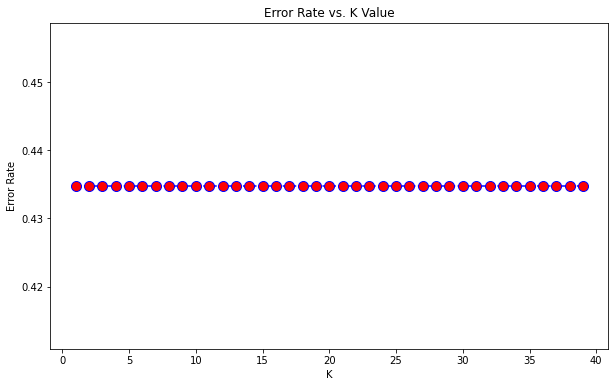

In [61]:
# sourced: https://datascienceplus.com/k-nearest-neighbors-knn-with-python/
# just testing the n_neigbors
# purpose: plot ths error rate (differene between actual and training data)
# Running KNN for various values of n_neighbors and storing results
error_rate = []
# Might take some time
for i in range(1,40):
    
    # Set up the hyperparameters
    # Instantiate the metric learner

    # Train the metric learner
    knn = KNeighborsClassifier(metric='manhattan',n_neighbors=23, p=i, weights='distance')
    knn.fit(data_x,data_y)

    pred_i = knn.predict(test_x)
    error_rate.append(np.mean(pred_i != test_y))
    
plt.figure(figsize=(10,6))
plt.plot(range(1,40),error_rate,color='blue', linestyle='dashed', marker='o',
         markerfacecolor='red', markersize=10)

# want to choose k with the least error rate
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')






In [85]:
from sklearn.metrics import accuracy_score

neighbors = list(range(1,40))
train_results = []
test_results = []
for n in neighbors:
   model = KNeighborsClassifier(n_neighbors=n)
   model.fit(data_x, data_y)
   y_pred = model.predict(data_x)
   roc_auc = accuracy_score(test_y, data_y)
   train_results.append(roc_auc)
   y_pred = model.predict(test_x)
   roc_auc = accuracy_score(test_y, y_pred)
   test_results.append(roc_auc)
    
from matplotlib.legend_handler import HandlerLine2D
line1, = plt.plot(neighbors, train_results, 'b', label="Train AUC")
line2, = plt.plot(neighbors, test_results, 'r', label="Test AUC")
plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)})
plt.ylabel("Accuracy score")
plt.xlabel("n_neighbors")
plt.show()

ValueError: Found input variables with inconsistent numbers of samples: [23, 90]

0.37142857142857144
              precision    recall  f1-score   support

         1.0       0.36      0.29      0.32        14
         2.0       0.38      0.69      0.49        13
         3.0       0.00      0.00      0.00         8

    accuracy                           0.37        35
   macro avg       0.25      0.33      0.27        35
weighted avg       0.28      0.37      0.31        35



/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


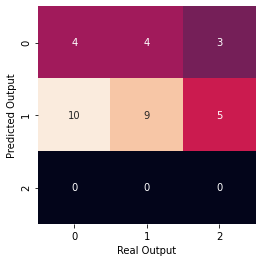

In [9]:
# hyper-parameter tuning knn
# tunning n_neighbors, metrics, weights 
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_curve, auc

import matplotlib as mpl
import matplotlib.pyplot as plt


model = KNeighborsClassifier(leaf_size=1, metric='manhattan', 
                             n_neighbors=23, p=0.1, weights='distance')


#model = KNeighborsClassifier(metric='wminkowski', p=2,
                             #metric_params=dict(w=2))
#weights = [2,3]

model.fit(data_x, data_y)
y_pred = model.predict(test_x)
pd.Series(data=y_pred, dtype="int64")


from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import classification_report

## Printing out the confusion matrix as a heatmap - comparing the trained y variable
## with the actual y variable 

conf_matrix = confusion_matrix(test_y, y_pred)
sns.heatmap(conf_matrix.T, square=True, annot=True, fmt='d', cbar=False)
plt.xlabel('Real Output')
plt.ylabel('Predicted Output')

##Calculate the accuracy of the model 
print(accuracy_score(test_y, y_pred) )

#Calculate the AUC-ROC curve number - i.e. tells how well the model is a distinguising between different classes
#print(roc_auc_score(test_y, y_pred))

## Evaluating the confusion matrix results - includes precission, recall, f1-score, support
print(classification_report(test_y, y_pred))




In [38]:
## need to figue out how to use it first 
import numpy as np
from argparse import Namespace
from sklearn.neighbors import KNeighborsClassifier
from GPyOpt.methods import BayesianOptimization

from pylmnn import LargeMarginNearestNeighbor


def find_hyperparams(X_train, y_train, X_valid, y_valid, params=None, max_bopt_iter=12):
    """Find the best hyperparameters for LMNN using Bayesian Optimisation.

    Parameters
    ----------

    X_train : array_like
           An array of training samples with shape (n_samples, n_features).

    y_train : array_like
           An array of training labels with shape (n_samples,).

    X_valid : array_like
           An array of validation samples with shape (m_samples, n_features).

    y_valid : array_like
           An array of validation labels with shape (m_samples,).

    params : dict
             A dictionary of parameters to be passed to the LargeMarginNearestNeighbor classifier instance.

    max_bopt_iter : int
            Maximum number of parameter configurations to evaluate (Default value = 12).

    Returns
    -------
    tuple:
        (int, int, int, int) The best hyperparameters found (n_neighbors, n_neighbors_predict, n_components, max_iter).

    """

    params = params or {}
    unique_labels, class_sizes = np.unique(y_train, return_counts=True)
    min_class_size = min(class_sizes)

    # Setting parameters for Bayesian Global Optimization
    args = Namespace()
    args.min_neighbors = 1
    args.max_neighbors = int(min(min_class_size - 1, 15))
    args.min_iter = 10
    args.max_iter = 200
    args.min_components = min(X_train.shape[1], 2)
    args.max_components = X_train.shape[1]

    bopt_iter = 0

    def optimize_clf(hyperparams):
        """The actual objective function with packing and unpacking of hyperparameters.

        Parameters
        ----------
        hyperparams : array_like
                 Vector of hyperparameters to evaluate.

        Returns
        -------
        float
            The validation error obtained.

        """

        hyperparams = hyperparams[0]
        n_neighbors = int(round(hyperparams[0]))
        n_neighbors_predict = int(round(hyperparams[1]))
        n_components = int(np.ceil(hyperparams[2]))
        max_iter = int(np.ceil(hyperparams[3]))
        weight_push_loss = float(np.ceil(hyperparams[4]))
        max_impostors = int(np.ceil(hyperparams[5]))

        nonlocal bopt_iter
        bopt_iter += 1
        print('Iteration {} of Bayesian Optimisation'.format(bopt_iter))
        print('Trying n_neighbors(lmnn)={}\tn_neighbors(knn)={}\tn_components={}\tmax_iter={} ...\n'
              .format(n_neighbors, n_neighbors_predict, n_components, max_iter, weight_push_loss,max_impostors))
        lmnn = LargeMarginNearestNeighbor(n_neighbors, max_iter=max_iter, n_components=n_components, 
                                          weight_push_loss=weight_push_loss,max_impostors=max_impostors, **params)
        lmnn.fit(X_train, y_train)
        clf = KNeighborsClassifier(n_neighbors=n_neighbors)
        clf.fit(lmnn.transform(X_train), y_train)

        print('Evaluating the found transformation on validation set of size {}...'.format(len(y_valid)))
        val_err = 1. - clf.score(lmnn.transform(X_valid), y_valid)

        print('Validation error={:2.4f}\n'.format(val_err))
        return val_err

    # Parameters are discrete but treating them as continuous yields better parameters
    domain = [{'name': 'n_neighbors', 'type': 'continuous', 'domain': (args.min_neighbors, args.max_neighbors)},
              {'name': 'n_neighbors_predict', 'type': 'continuous', 'domain': (args.min_neighbors, args.max_neighbors)},
              {'name': 'n_components', 'type': 'continuous', 'domain': (args.min_components, args.max_components)},
              {'name': 'max_iter', 'type': 'continuous', 'domain': (args.min_iter, args.max_iter)},
              {'name': 'weight_push_loss', 'type': 'continuous', 'domain': (0, 1)},
              {'name': 'max_impostors', 'type': 'continuous', 'domain': (1, 1000000)}]
    bo = BayesianOptimization(f=optimize_clf, domain=domain)
    bo.run_optimization(max_iter=max_bopt_iter)

    solution = bo.x_opt
    print(solution)
    best_n_neighbors = int(round(solution[0]))
    best_n_neighbors_predict = int(round(solution[1]))
    best_n_components = int(np.ceil(solution[2]))
    best_max_iter = int(np.ceil(solution[3]))
    best_weight_push_loss = float(np.ceil(solution[4]))
    best_max_impostors = int(np.ceil(solution[5]))

    print('Best parameters: n_neighbors(lmnn)={} n_neighbors(knn)={} n_components={} max_iter={}\n'.
          format(best_n_neighbors, best_n_neighbors_predict, best_n_components, best_max_iter, best_weight_push_loss, best_max_impostors))

    return best_n_neighbors, best_n_neighbors_predict, best_n_components, best_max_iter, best_weight_push_loss, best_max_impostors

#execute


find_hyperparams(X_train=data_x, y_train=data_y, X_valid=test_x, y_valid=test_y, max_bopt_iter=12)



Iteration 1 of Bayesian Optimisation
Trying n_neighbors(lmnn)=4	n_neighbors(knn)=8	n_components=11	max_iter=31 ...

Evaluating the found transformation on validation set of size 35...
Validation error=0.6857

Iteration 2 of Bayesian Optimisation
Trying n_neighbors(lmnn)=5	n_neighbors(knn)=8	n_components=11	max_iter=169 ...

Evaluating the found transformation on validation set of size 35...
Validation error=0.6571

Iteration 3 of Bayesian Optimisation
Trying n_neighbors(lmnn)=10	n_neighbors(knn)=10	n_components=12	max_iter=75 ...

Evaluating the found transformation on validation set of size 35...
Validation error=0.6571

Iteration 4 of Bayesian Optimisation
Trying n_neighbors(lmnn)=9	n_neighbors(knn)=11	n_components=6	max_iter=184 ...

Evaluating the found transformation on validation set of size 35...
Validation error=0.5429

Iteration 5 of Bayesian Optimisation
Trying n_neighbors(lmnn)=2	n_neighbors(knn)=3	n_components=4	max_iter=199 ...

Evaluating the found transformation on valid

(3, 9, 3, 56, 1.0, 708512)

In [16]:
#tune hyperparmeter 
param_space = {
            'n_neighbors': (1, 20),  # integer valued parameter
            'n_components': (1, 10),  # categorical parameter
            'init': ['pca'], # categorical parameter
            'max_impostors': (1,100),
            'weight_push_loss': (0,1),
            'neighbors_params': {
            'weights': ['uniform', 'distance'],  # categorical parameter
            'metric': ['euclidean', 'manhattan', 'minkowski'], # categorical parameter
            'p': (0.1,10),
            'leaf_size': (0.01,40)
                
            }
        }

In [37]:
from pylmnn import LargeMarginNearestNeighbor as LMNN
from sklearn.neighbors import KNeighborsClassifier

# Set up the hyperparameters
# Instantiate the metric learner
#lmnn = LMNN(n_neighbors=13, max_iter=63, n_components=2 )
# adding make no difference: weight_push_loss=1.0
# max_impostors=871159
lmnn = LMNN(n_neighbors=3, max_iter=56, n_components=3 )
#10, 5, 6, 109, 1.0, 646122

# Train the metric learner
lmnn.fit(data_x, data_y)

# Fit the nearest neighbors classifier
knn = KNeighborsClassifier(n_neighbors=9)
knn.fit(lmnn.transform(data_x), data_y)

# Compute the k-nearest neighbor test accuracy after applying the learned transformation
lmnn_acc = knn.score(lmnn.transform(test_x), test_y)
print('LMNN accuracy on test set of {} points: {:.4f}'.format(test_x.shape[0], lmnn_acc))


# 0.8 cor & new data set & cfs = 0.5179


LMNN accuracy on test set of 35 points: 0.4286


The best parameters are {'max_features': 1} with a score of 0.41
<bound method NDFrame.head of    max_features  Accuracy
0             1  0.410714
1            50       NaN>
0.375
              precision    recall  f1-score   support

         1.0       0.35      0.43      0.39        14
         2.0       0.59      0.42      0.49        31
         3.0       0.12      0.18      0.14        11

    accuracy                           0.38        56
   macro avg       0.35      0.34      0.34        56
weighted avg       0.44      0.38      0.40        56



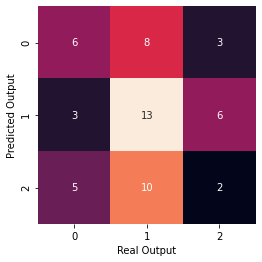

In [56]:

# import external modules.
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.tree import ExtraTreeClassifier
import sklearn
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import AdaBoostClassifier




# tree classifer hyper-parameter tunning
# suggestions for decision tree: https://towardsdatascience.com/how-to-tune-a-decision-tree-f03721801680
# can i just treat tree classifer like a decision tree?
#tunning number of trees -using n_estimators -> keep increasing until it stablishes
#param_grid = {'n_estimators': [10, 50, 100, 500, 1000, 5000]}  

#tunning number of features
# should be optimal around the square root of the number of features in total
#param_space = {
#            'max_features': (1, 21),  # integer valued parameter}


model = ExtraTreeClassifier()



cv = RepeatedKFold(n_splits=2, n_repeats=2, random_state=1)
# use this one for classifiation - esp, when there is an inbalance in the classes (i.e. a lot are high reuse rate, 
# but barely any are low)
# requirement - that the number of different samples in each class (i.e. high reusability) is greater then n_splits
# cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=1)

# Defines the parameter search space
param_space = {
            'max_features': (1, 50)  # integer valued parameter
    }
# look at


# Set all the variables for the grid search cross validation 
search = GridSearchCV(estimator=model, param_grid=param_space, cv=cv, n_jobs=-1, scoring='accuracy')

# perform the search - i.e. it fits the model on the training data set for the different hyper-parameter settings
search_result = search.fit(data_x, data_y)

# Prints the results - optimal hyper-parameters and the accuracy score
print("The best parameters are %s with a score of %0.2f"
    % (search_result.best_params_, search_result.best_score_))

# Displays all of the hyper-parameters combination in descending order of accuracy score
grid_results = pd.concat([pd.DataFrame(search_result.cv_results_["params"]),pd.DataFrame(search_result.cv_results_["mean_test_score"], columns=["Accuracy"])],axis=1)
grid_results.sort_values(by=['Accuracy'], inplace=True, ascending=False)
print(grid_results.head)


# below is model fitting 

extra_tree = ExtraTreeClassifier()
model = AdaBoostClassifier(extra_tree)


model.fit(data_x, data_y)
y_pred = model.predict(test_x)


from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import classification_report

## Printing out the confusion matrix as a heatmap - comparing the trained y variable
## with the actual y variable 

conf_matrix = confusion_matrix(test_y, y_pred)
sns.heatmap(conf_matrix.T, square=True, annot=True, fmt='d', cbar=False)
plt.xlabel('Real Output')
plt.ylabel('Predicted Output')

##Calculate the accuracy of the model 
print(accuracy_score(test_y, y_pred) )

## Evaluating the confusion matrix results - includes precission, recall, f1-score, support
print(classification_report(test_y, y_pred))


In [102]:
#neural network hyper-parameter tunning
# suggestions for neural net: https://towardsdatascience.com/simple-guide-to-hyperparameter-tuning-in-neural-networks-3fe03dad8594
# adjusting learning rate





In [146]:
#svn forward feature selection
from skfeature.function.wrapper import svm_forward

svm_forward.svm_forward(x.to_numpy(),y.to_numpy(),5)




TypeError: __init__() got an unexpected keyword argument 'n_folds'

In [76]:
# import external modules.
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import sklearn
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn.metrics import f1_score


# svm hyper-parameter tuning
# if kernel is only linear
# optimise c parameter
#param_grid = {'C': [0.1, 1, 10, 100],  
#              'kernel': ['linear']}  


#if kernel is radial
# both gamma and c need to be optimised
# note: If gamma is large, the effect of c becomes negligible. If gamma is small, c affects the model just like how it affects a linear model.

# defining parameter range 
#param_grid = {'C': [0.1, 1, 10, 100],  
#              'gamma': [10, 1, 0.1, 0.01, 0.001, 0.0001], 
#              'kernel': ['rbf']}  

# Defines the parameter search space
#param_grid = {'C': [0.1, 1, 10,100,1000],  
#              'gamma': [10000,1000, 100, 10], 
#              'kernel': ['sigmoid']}  


# if kernel is polynomial
# note: If the polynomial kernel works out, then it is a good idea to dive into the degree hyperparameter.


#results:
# kernel 'rbf' works the best - for the above hyperparameter settings - 0.62 f1 score, 0.64 accuracy score
# **** although seems to be overfitting/underfitting since actual tes
# poly kernel - takes forever to run, so not sure yet 


model = SVC()

cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=1)

# Defines the parameter search space
param_grid = {'C': [0.1, 1, 10,100,1000],  
              'gamma': (100,1500), 
              'kernel': ['rbf','linear','sigmoid'],
               'decision_function_shape': ['ovo','ovr']}

# Set all the variables for the grid search cross validation 
search = GridSearchCV(estimator=model, param_grid=param_grid, cv=cv, n_jobs=-1, scoring='accuracy')

# perform the search - i.e. it fits the model on the training data set for the different hyper-parameter settings
search_result = search.fit(data_x, data_y)

# Prints the results - optimal hyper-parameters and the accuracy score
print("The best parameters are %s with a score of %0.2f"
    % (search_result.best_params_, search_result.best_score_))

# Displays all of the hyper-parameters combination in descending order of accuracy score
grid_results = pd.concat([pd.DataFrame(search_result.cv_results_["params"]),pd.DataFrame(search_result.cv_results_["mean_test_score"], columns=["accuracy"])],axis=1)
grid_results.sort_values(by=['accuracy'], inplace=True, ascending=False)
print(grid_results.head)





The best parameters are {'C': 10, 'decision_function_shape': 'ovo', 'gamma': 1500, 'kernel': 'rbf'} with a score of 0.52
<bound method NDFrame.head of          C decision_function_shape  gamma   kernel  accuracy
33    10.0                     ovr   1500      rbf  0.522222
57  1000.0                     ovr   1500      rbf  0.522222
27    10.0                     ovo   1500      rbf  0.522222
51  1000.0                     ovo   1500      rbf  0.522222
45   100.0                     ovr   1500      rbf  0.522222
39   100.0                     ovo   1500      rbf  0.522222
12     1.0                     ovo    100      rbf  0.503704
18     1.0                     ovr    100      rbf  0.503704
15     1.0                     ovo   1500      rbf  0.500000
21     1.0                     ovr   1500      rbf  0.500000
34    10.0                     ovr   1500   linear  0.492593
31    10.0                     ovr    100   linear  0.492593
28    10.0                     ovo   1500   linear  0.49

Text(0, 0.5, 'Error Rate')

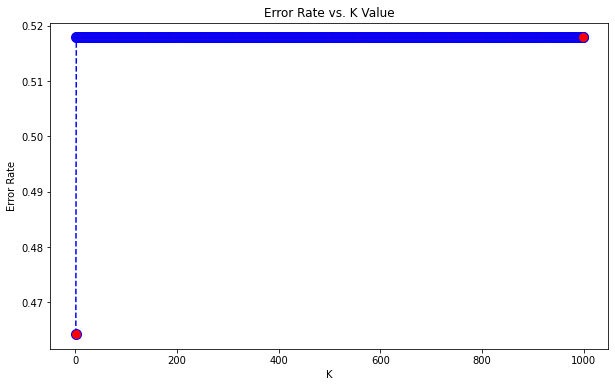

In [54]:
error_rate = []
# Might take some time
for i in range(1,1000):
    
    # Set up the hyperparameters
    # Instantiate the metric learner

    # Train the metric learner
    model = SVC(C=i,gamma=750,kernel='rbf')
    model.fit(data_x,data_y)

    pred_i = model.predict(test_x)
    error_rate.append(np.mean(pred_i != test_y))
    
plt.figure(figsize=(10,6))
plt.plot(range(1,1000),error_rate,color='blue', linestyle='dashed', marker='o',
         markerfacecolor='red', markersize=10)

# want to choose k with the least error rate
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')

Text(0, 0.5, 'Error Rate')

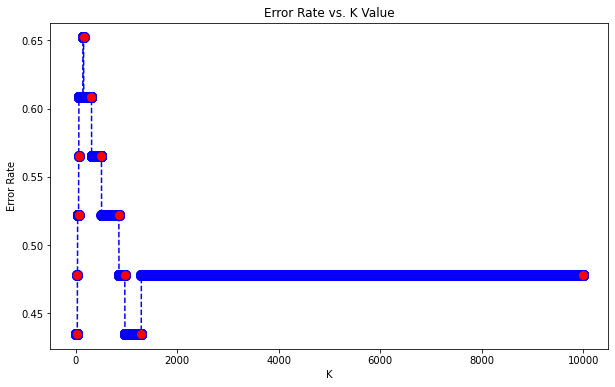

In [77]:
error_rate = []
# Might take some time
for i in range(1,10000):
    
    # Set up the hyperparameters
    # Instantiate the metric learner

    # Train the metric learner
    model = SVC(C=1,gamma=i,kernel='rbf')
    model.fit(data_x,data_y)

    pred_i = model.predict(test_x)
    error_rate.append(np.mean(pred_i != test_y))
    
plt.figure(figsize=(10,6))
plt.plot(range(1,10000),error_rate,color='blue', linestyle='dashed', marker='o',
         markerfacecolor='red', markersize=10)

# want to choose k with the least error rate
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')

0.4
              precision    recall  f1-score   support

         1.0       0.60      0.21      0.32        14
         2.0       0.37      0.85      0.51        13
         3.0       0.00      0.00      0.00         8

    accuracy                           0.40        35
   macro avg       0.32      0.35      0.28        35
weighted avg       0.38      0.40      0.32        35



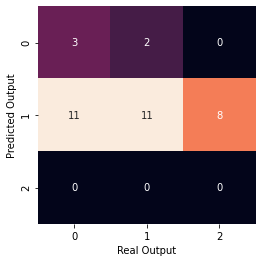

In [16]:

# import external modules.
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import sklearn
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn.metrics import f1_score


# below is model fitting 

model = SVC(C=10,gamma=1750,kernel='rbf')
model.fit(data_x, data_y)
y_pred = model.predict(test_x)


from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import classification_report

## Printing out the confusion matrix as a heatmap - comparing the trained y variable
## with the actual y variable 

conf_matrix = confusion_matrix(test_y, y_pred)
sns.heatmap(conf_matrix.T, square=True, annot=True, fmt='d', cbar=False)
plt.xlabel('Real Output')
plt.ylabel('Predicted Output')

##Calculate the accuracy of the model 
print(accuracy_score(test_y, y_pred) )

## Evaluating the confusion matrix results - includes precission, recall, f1-score, support
print(classification_report(test_y, y_pred))


#new data set & 0.8 cor & cfs -> 0.5714285714285714
#using cfs + mutual information -> 0.5652173913043478


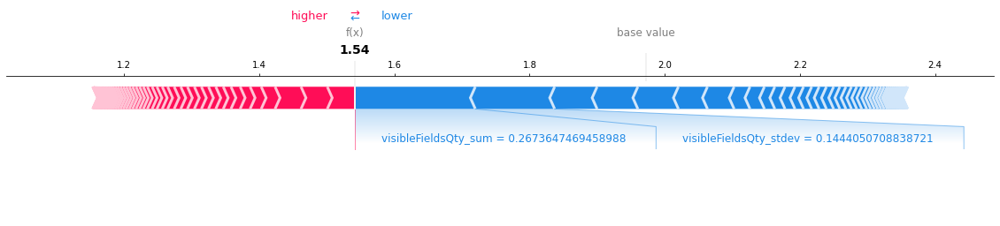

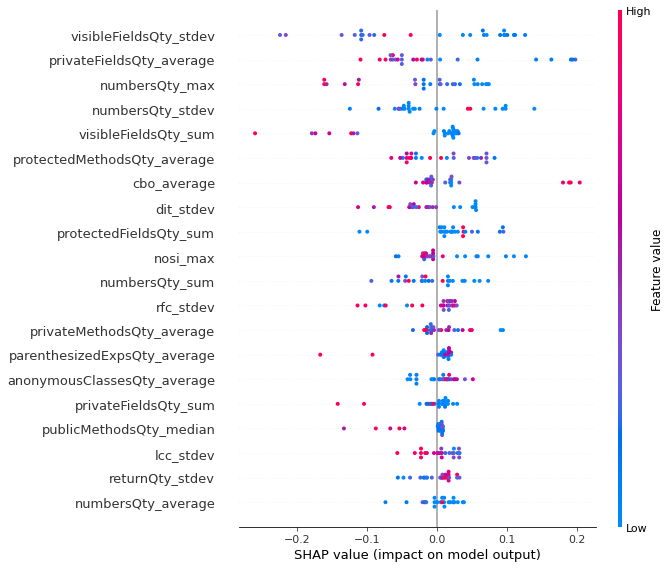

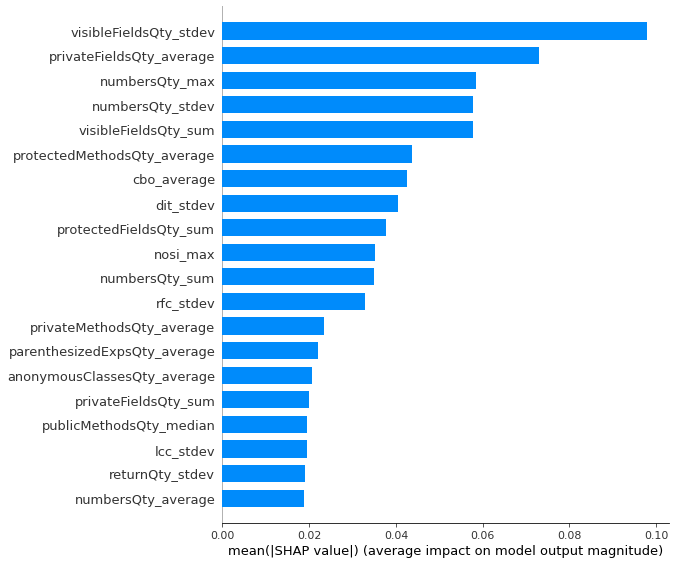

In [41]:
# reference: code is from this github: https://github.com/slundberg/shap
# github code has more visulations ways, explanations and papers the autor wrote and is related too
# idk really understand what is happening either, but it seems cool haha 
# reference: explanation of using this code is from article: https://towardsdatascience.com/feature-selection-techniques-for-classification-and-python-tips-for-their-application-10c0ddd7918b

# Note: according to article above, this algo is specifically good for tree based classifers 
# Comment: the modifers_median was also identified as the most important feature by far when using
# the seleck k best using f-regression property (from scikit learn). idk if that says anything
# Correction on comment: maybe not, just tried and isn't

import xgboost
import shap

# This part - Tree ensemble example with TreeExplainer
# Comment: the shap code set also has agnostic model method - i.e that can use any model 
# other then just tree based 

# load JS visualization code to notebook
shap.initjs()
# train XGBoost model
model = xgboost.train({
    "learning_rate": 0.1,
 "max_depth": 5,
 "min_child_weight": 1,
 "gamma": 0,
 "subsample": 0.8,
 "colsample_bytree": 0.8,
 "nthread": 4,
 "scale_pos_weight": 1,
 "seed": 27
}, xgboost.DMatrix(data_x, label=data_y), 100)


# explain the model's predictions using SHAP values
# (same syntax works for LightGBM, CatBoost, and scikit-learn models)
explainer = shap.TreeExplainer(model)
shap_values_test = explainer.shap_values(test_x)
shap_values_train = explainer.shap_values(data_x)

# This shows the impacts of the various features has on pushing the average target value - maven reuse out from the
# average 
# visualize the first prediction's explanation (use matplotlib=True to avoid Javascript)
shap.force_plot(explainer.expected_value, shap_values_test[0,:], test_x.iloc[0,:], matplotlib=True)

# visualize the training set predictions - idk how to get this one to work
shap.force_plot(explainer.expected_value, shap_values_test, test_x)

# summarize the effects of all the features
shap.summary_plot(shap_values_test, test_x)

# Takes the mean absolute value of the SHAP values for each feature to get a 
# standard bar plot (produces stacked bars for multi-class outputs)
shap.summary_plot(shap_values_test, test_x, plot_type="bar")


In [51]:
# reference: code is from this github: https://github.com/slundberg/shap
# github code has more visulations ways, explanations and papers the autor wrote and is related too
# idk really understand what is happening either, but it seems cool haha 
# reference: explanation of using this code is from article: https://towardsdatascience.com/feature-selection-techniques-for-classification-and-python-tips-for-their-application-10c0ddd7918b

# Note: according to article above, this algo is specifically good for tree based classifers 
# Comment: the modifers_median was also identified as the most important feature by far when using
# the seleck k best using f-regression property (from scikit learn). idk if that says anything
# Correction on comment: maybe not, just tried and isn't

import sklearn.ensemble
import shap
from sklearn.metrics import accuracy_score

# using random forest 
# load JS visualization code to notebook
shap.initjs()

# train random forest model
model = sklearn.ensemble.RandomForestClassifier()
model.fit(data_x, data_y)
#y_pred = model.predict(test_x)
#accuracy_score(test_y, y_pred)

# explain the model's predictions using SHAP values
# (same syntax works for LightGBM, CatBoost, and scikit-learn models)
explainer = shap.TreeExplainer(model)
shap_values_test = explainer.shap_values(test_x)
shap_values_train = explainer.shap_values(data_x)

# This shows the impacts of the various features has on pushing the average target value - maven reuse out from the
# average 
# visualize the first prediction's explanation (use matplotlib=True to avoid Javascript)
#shap.force_plot(explainer.expected_value, shap_values_test[0,:], test_x.iloc[0,:], matplotlib=True)

# visualize the training set predictions - idk how to get this one to work
#shap.force_plot(explainer.expected_value, shap_values_test[0,], test_x)

# summarize the effects of all the features
shap.summary_plot(shap_values_test, test_x)

# Takes the mean absolute value of the SHAP values for each feature to get a 
# standard bar plot (produces stacked bars for multi-class outputs)
shap.summary_plot(shap_values_test, test_x, plot_type="bar")

TypeError: list indices must be integers or slices, not tuple

In [9]:
# reference: code is from this github: https://github.com/slundberg/shap
# github code has more visulations ways, explanations and papers the autor wrote and is related too
# idk really understand what is happening either, but it seems cool haha 
# reference: explanation of using this code is from article: https://towardsdatascience.com/feature-selection-techniques-for-classification-and-python-tips-for-their-application-10c0ddd7918b

# Note: according to article above, this algo is specifically good for tree based classifers 
# Comment: the modifers_median was also identified as the most important feature by far when using
# the seleck k best using f-regression property (from scikit learn). idk if that says anything
# Correction on comment: maybe not, just tried and isn't

import sklearn.ensemble
import sklearn
import shap

# using random forest 
# load JS visualization code to notebook
shap.initjs()

# train random forest model
model = sklearn.neighbors.KNeighborsClassifier()
model.fit(data_x, data_y)

"""
Must use Kernel method on KNN.
Rather than use the whole training set to estimate expected values, we summarize with
 a set of weighted kmeans, each weighted by the number of points they represent.
 Running without the kmeans took 1 hr 6 mins 7 sec. 
 Running with the kmeans took 2 min 47 sec.
Boston Housing is a very small dataset.
Running SHAP on models that require Kernel method and have a good amount of data becomes prohibitive. 
"""
#X_train_summary = shap.kmeans(data_x, 10)
# using kmeans to explain the model's predictions
explainer = shap.KernelExplainer(model.predict_proba, data_x)
shap_values_test = explainer.shap_values(test_x)
shap_values_train = explainer.shap_values(data_x)

# This shows the impacts of the various features has on pushing the average target value - maven reuse out from the
# average 
# visualize the first prediction's explanation (use matplotlib=True to avoid Javascript)
shap.force_plot(explainer.expected_value, shap_values_test[0,:], test_x.iloc[0,:], matplotlib=True)

# visualize the training set predictions - idk how to get this one to work
shap.force_plot(explainer.expected_value, shap_values_test, test_x)

# summarize the effects of all the features
shap.summary_plot(shap_values_test, test_x)

# Takes the mean absolute value of the SHAP values for each feature to get a 
# standard bar plot (produces stacked bars for multi-class outputs)
shap.summary_plot(shap_values_test, test_x, plot_type="bar")

TypeError: list indices must be integers or slices, not tuple

In [14]:

# reference: code is from this github: https://github.com/slundberg/shap
# github code has more visulations ways, explanations and papers the autor wrote and is related too
# idk really understand what is happening either, but it seems cool haha 
# reference: explanation of using this code is from article: https://towardsdatascience.com/feature-selection-techniques-for-classification-and-python-tips-for-their-application-10c0ddd7918b

# Note: according to article above, this algo is specifically good for tree based classifers 
# Comment: the modifers_median was also identified as the most important feature by far when using
# the seleck k best using f-regression property (from scikit learn). idk if that says anything
# Correction on comment: maybe not, just tried and isn't

import xgboost
import shap

# This part - Tree ensemble example with TreeExplainer
# Comment: the shap code set also has agnostic model method - i.e that can use any model 
# other then just tree based 

import time

def print_accuracy(f):
    print("Accuracy = {0}%".format(100*np.sum(f(test_x) == test_y)/len(test_y)))
    time.sleep(0.5) # to let the print get out before any progress bars

# load JS visualization code to notebook
shap.initjs()
# train XGBoost model
model = sklearn.svm.SVC(kernel='rbf', probability=True)
model.fit(data_x, data_y)
print_accuracy(model.predict)

# explain the model's predictions using SHAP values
# (same syntax works for LightGBM, CatBoost, and scikit-learn models)
explainer = shap.KernelExplainer(model.predict_proba, data_x)
shap_values_test = explainer.shap_values(test_x)
shap_values_train = explainer.shap_values(data_x)

# This shows the impacts of the various features has on pushing the average target value - maven reuse out from the
# average 
# visualize the first prediction's explanation (use matplotlib=True to avoid Javascript)
shap.force_plot(explainer.expected_value, shap_values_test[0,:], test_x.iloc[0,:], matplotlib=True)

# visualize the training set predictions - idk how to get this one to work
shap.force_plot(explainer.expected_value, shap_values_test, test_x)

# summarize the effects of all the features
shap.summary_plot(shap_values_test, test_x)

# Takes the mean absolute value of the SHAP values for each feature to get a 
# standard bar plot (produces stacked bars for multi-class outputs)
shap.summary_plot(shap_values_test, test_x, plot_type="bar")

shap.force_plot(explainer.expected_value[0], shap_values[0], X_test)

Accuracy = 1.5384615384615385%


KeyboardInterrupt: 

In [20]:
display(data_x)
display(data_y)

,privateMethodsQty_average,privateMethodsQty_stdev,privateMethodsQty_median,privateMethodsQty_max,parenthesizedExpsQty_stdev,parenthesizedExpsQty_median,parenthesizedExpsQty_max,stringLiteralsQty_average,stringLiteralsQty_max,uniqueWordsQty_stdev,...,protectedFieldsQty_max,modifiers_sum,modifiers_stdev,modifiers_median,modifiers_min,modifiers_max,loopQty_stdev,finalFieldsQty_average,finalFieldsQty_stdev,finalFieldsQty_median
38,0.260000,0.404600,0.0,0.066667,0.107763,0.50,0.032710,0.054348,0.005730,0.009533,...,0.085202,0.000031,0.010791,0.111111,0.0,0.007812,0.042196,0.650794,0.109843,0.666667
70,0.197389,0.324257,0.0,0.171429,0.661906,0.00,0.841121,0.066060,0.026739,0.025973,...,0.192825,0.016874,0.417358,0.111111,0.0,0.504395,0.120275,0.466866,0.120052,0.666667
55,0.027966,0.072846,0.0,0.028571,0.041294,0.00,0.028037,0.098448,0.148431,0.010110,...,0.004484,0.010346,0.642748,0.000000,0.0,0.505371,0.017941,0.153349,0.052658,0.000000
84,0.249815,0.332823,0.0,0.161905,0.334854,0.00,1.000000,0.028526,0.065211,0.013891,...,0.233184,0.104989,0.368721,0.111111,0.0,0.503906,0.050476,0.224524,0.056792,0.000000
28,0.208368,0.300341,0.0,0.142857,0.068303,0.00,0.049065,0.053174,0.066303,0.012471,...,0.089686,0.008156,0.405346,0.111111,0.0,0.500000,0.054341,0.409444,0.086749,0.000000
49,0.215854,0.953634,0.0,0.628571,0.095267,0.00,0.067757,0.070923,0.031651,0.008538,...,0.210762,0.004935,0.371659,0.111111,0.0,0.503906,0.108100,0.303426,0.145085,0.000000
2,0.172662,0.321071,0.0,0.161905,0.176645,0.00,0.331776,0.056554,0.049113,0.014067,...,0.085202,0.083080,0.591532,0.944444,0.0,0.504395,0.086731,0.290217,0.075387,0.000000
76,0.083886,0.287173,0.0,0.180952,0.640273,0.00,1.000000,0.013592,0.036835,0.028863,...,0.197309,0.054772,0.754318,0.111111,0.0,0.504395,0.107095,0.155157,0.084473,0.000000
33,0.307895,0.348981,0.0,0.095238,0.030800,0.00,0.007009,0.034095,0.009550,0.007417,...,0.022422,0.000247,0.018734,0.111111,0.0,0.012207,0.073974,0.200501,0.039029,0.000000
8,0.029268,0.052962,0.0,0.009524,0.078301,0.00,0.025701,0.131017,0.013097,0.016981,...,0.026906,0.003442,0.632510,0.111111,0.0,0.500000,0.043647,0.116144,0.036377,0.000000


38     3.0
70     2.0
55     2.0
84     1.0
28     1.0
49     2.0
2      2.0
76     1.0
33     2.0
8      3.0
99     3.0
14     1.0
104    1.0
109    3.0
18     2.0
34     3.0
58     2.0
79     3.0
114    2.0
106    2.0
56     2.0
86     2.0
52     3.0
88     1.0
74     2.0
117    3.0
100    1.0
6      2.0
3      2.0
111    2.0
66     2.0
7      2.0
44     1.0
105    2.0
62     2.0
4      3.0
17     2.0
19     2.0
5      3.0
108    1.0
54     2.0
89     1.0
45     3.0
35     3.0
12     2.0
87     1.0
29     3.0
11     1.0
40     2.0
69     3.0
97     2.0
1      1.0
41     1.0
107    1.0
15     3.0
77     1.0
23     2.0
37     3.0
68     2.0
65     2.0
30     2.0
46     3.0
21     3.0
0      2.0
115    1.0
24     3.0
Name: maven_reuse, dtype: float64

In [12]:
from sklearn.svm import SVR

pre_training_analysis_tools.recursive_feature_elimination(data_x, data_y, estimator=SVR(kernel="linear") )

ValueError: Classification metrics can't handle a mix of multiclass and continuous targets

In [110]:
# currently set to use the scikit learn select k best - using f-regression,
# Comment: there are other statistics - anonva, mutal information in the python pre training analysis tools
pre_training_analysis_tools.univariate_selection(data_x, data_y)

                          Feature     Score
156     protectedMethodsQty_stdev  0.195346
82                  returnQty_sum  0.186206
13           publicMethodsQty_sum  0.182566
122                   dit_average  0.176950
5    parenthesizedExpsQty_average  0.173528
44                        rfc_sum  0.167899
40                    wmc_average  0.167409
30           logStatementsQty_max  0.165029
88              modifiers_average  0.163573
121                       dit_sum  0.162059
70          stringLiteralsQty_sum  0.156006
165           finalMethodsQty_sum  0.147846
2    synchronizedMethodsQty_stdev  0.142995
63         visibleFieldsQty_stdev  0.141102
140                     loc_stdev  0.138002
50      privateMethodsQty_average  0.137809
73          stringLiteralsQty_max  0.132531
66         uniqueWordsQty_average  0.131890
45                    rfc_average  0.131030
158                       tcc_sum  0.128136


[0.06801589 0.08757995 0.08080389 0.10394115 0.07745056 0.04932499
 0.06556804 0.1044408  0.09382864 0.09552726 0.0843285  0.08919035]


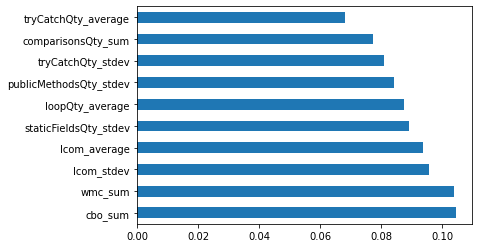

ExtraTreesClassifier
                               0
cbo_sum                 0.104441
wmc_sum                 0.103941
lcom_stdev              0.095527
lcom_average            0.093829
staticFieldsQty_stdev   0.089190
loopQty_average         0.087580
publicMethodsQty_stdev  0.084329
tryCatchQty_stdev       0.080804
comparisonsQty_sum      0.077451
tryCatchQty_average     0.068016


In [13]:
pre_training_analysis_tools.feature_importance_ExtraTreesClassifier(data_x, data_y)

In [137]:
# reference: https://pandas-profiling.github.io/pandas-profiling/docs/master/index.html
# https://pypi.org/project/pandas-profiling/
# cool tool using pandas profiling - is able to generate a report that includes
# scatter plots, correlation matrixes, identifying highly correlated features, features
# with only unique values, features with zero's etc -> "when minimal is not set to true" -> but
# can take very long (hours)
# mininal report is in the output.html file too


import pandas_profiling
from pandas_profiling import ProfileReport
profile = ProfileReport(data_x_y, minimal=True)
#profile.to_file("output.html")
#profile.to_widgets()
profile.to_notebook_iframe()

#comments on the report
# a lot of the metrics have a lot of "zero" datapoints -> some are just a few zero, some as high as 90% of zero's
# -> is there a level at which too many zero's in a metric could cause problem and be removed
# there are (12) that have limited distinct values -> i.e. over 130 datapoints, there are only
# 3 or 4 disctinct values spread across it 
# there is 1 -> that has all distinct values
# alot are left skewed / have most (80/90%) of the data points between 0 -0.4 (i.e. seem normally distributed
# in that region) with minor above that

#remove due to excess 0
# tcc_stdev, stringLiteralsQty_median, assignmentsQty_median, synchronizedMethodsQty_sum,
# synchronizedMethodsQty_average, synchronizedMethodsQty_stdev

# remove due to excess 0, above 40%
# stringLiteralsQty_median, totalFieldsQty_sum, totalFieldsQty_average, totalFieldsQty_stdev,
# totalFieldsQty_max, staticFieldsQty_median, numbersQty_median, nosi_median,
# maxNestedBlocksQty_median, lambdasQty_sum, lambdasQty_average, lambdasQty_stdev, 
# lambdasQty_max, lcom_median, protectedFieldsQty_median, comparisonsQty_median
# tcc_median, tcc_min, privateMethodsQty_median, publicFieldsQty_median, parenthesizedExpsQty_median,
# stringLiteralsQty_median, privateFieldsQty_median, defaultMethodsQty_median, dit_median,
# lcc_median, lcc_min, mathOperationsQty_median, staticMethodsQty_median, tryCatchQty_median,
# modifiers_min, loopQty_median, finalFieldsQty_median, 


In [84]:
# reference: https://pandas-profiling.github.io/pandas-profiling/docs/master/index.html
# https://pypi.org/project/pandas-profiling/
# cool tool using pandas profiling - is able to generate a report that includes
# scatter plots, correlation matrixes, identifying highly correlated features, features
# with only unique values, features with zero's etc -> "when minimal is not set to true" -> but
# can take very long (hours)
# mininal report is in the output.html file too


import pandas_profiling
from pandas_profiling import ProfileReport
profile = ProfileReport(x)
#profile.to_file("output.html")
#profile.to_widgets()
profile.to_notebook_iframe()

#comments on the report
# a lot of the metrics have a lot of "zero" datapoints -> some are just a few zero, some as high as 90% of zero's
# -> is there a level at which too many zero's in a metric could cause problem and be removed
# there are (12) that have limited distinct values -> i.e. over 130 datapoints, there are only
# 3 or 4 disctinct values spread across it 
# there is 1 -> that has all distinct values
# alot are left skewed / have most (80/90%) of the data points between 0 -0.4 (i.e. seem normally distributed
# in that region) with minor above that